In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
from fastai import vision
from fastai import metrics
from pathlib import Path

In [3]:
# List of avaialble functionalities

dir(vision)

['AUROC',
 'AccumulateScheduler',
 'AdamW',
 'AdaptiveConcatPool2d',
 'AffineFunc',
 'AffineMatrix',
 'AnnealFunc',
 'Any',
 'AnyStr',
 'ArgStar',
 'AverageMetric',
 'BCEFlat',
 'BCEWithLogitsFlat',
 'BatchNorm1dFlat',
 'BatchSampler',
 'BatchSamples',
 'BnFreeze',
 'BoolOrTensor',
 'BufferedWriter',
 'ByteTensor',
 'BytesIO',
 'Callable',
 'Callback',
 'CallbackHandler',
 'CallbackList',
 'Category',
 'CategoryList',
 'CategoryProcessor',
 'ClassificationInterpretation',
 'Collection',
 'Config',
 'ConfusionMatrix',
 'CoordFunc',
 'Counter',
 'CrossEntropyFlat',
 'DataBunch',
 'DataFrame',
 'DataFrameOrChunks',
 'DataLoader',
 'Dataset',
 'DatasetType',
 'Debugger',
 'DeviceDataLoader',
 'Dict',
 'DistributedDataParallel',
 'DoubleTensor',
 'EmptyLabel',
 'EmptyLabelList',
 'Enum',
 'ExpRMSPE',
 'ExplainedVariance',
 'F',
 'FBeta',
 'FilePathList',
 'Flatten',
 'FlattenedLoss',
 'FloatItem',
 'FloatList',
 'FloatOrTensor',
 'FloatTensor',
 'Floats',
 'FlowField',
 'GradientClipping',


# Data Exploration

In [9]:
!unzip /content/drive/My\ Drive/FastAI/Dataset/DevanagariHandwrittenCharacterDataset.zip -d /content/

Archive:  /content/drive/My Drive/FastAI/Dataset/DevanagariHandwrittenCharacterDataset.zip
   creating: /content/DevanagariHandwrittenCharacterDataset/
   creating: /content/DevanagariHandwrittenCharacterDataset/Test/
   creating: /content/DevanagariHandwrittenCharacterDataset/Train/
   creating: /content/DevanagariHandwrittenCharacterDataset/Test/character_10_yna/
 extracting: /content/DevanagariHandwrittenCharacterDataset/Test/character_10_yna/10544.png  
 extracting: /content/DevanagariHandwrittenCharacterDataset/Test/character_10_yna/10551.png  
 extracting: /content/DevanagariHandwrittenCharacterDataset/Test/character_10_yna/121.png  
 extracting: /content/DevanagariHandwrittenCharacterDataset/Test/character_10_yna/125.png  
 extracting: /content/DevanagariHandwrittenCharacterDataset/Test/character_10_yna/135.png  
 extracting: /content/DevanagariHandwrittenCharacterDataset/Test/character_10_yna/13642.png  
 extracting: /content/DevanagariHandwrittenCharacterDataset/Test/character

In [13]:
path = Path("/content/DevanagariHandwrittenCharacterDataset/")
path

PosixPath('/content/DevanagariHandwrittenCharacterDataset')

In [22]:
img_path = path.ls()[0].ls()
len(img_path)

46

In [23]:
fn_path = sum([x.ls() for x in img_path], [])
fn_path[:2]

[PosixPath('/content/DevanagariHandwrittenCharacterDataset/Train/character_7_chha/84861.png'),
 PosixPath('/content/DevanagariHandwrittenCharacterDataset/Train/character_7_chha/15574.png')]

In [0]:
tfms = vision.get_transforms(do_flip=False)

In [0]:
# Both works. First use the regualr expression to get class anme while other used the labels list.
pat = r"/(\w+)/[a-zA-Z0-9_-]+.png$"
data = vision.ImageDataBunch.from_name_re(path, fn_path, pat=pat, ds_tfms=tfms, size=32)

#labels = [str(x).split("/")[-2] for x in fn_path]
#data = vision.ImageDataBunch.from_lists(path, fn_path, labels = labels, ds_tfms=tfms, size=96)

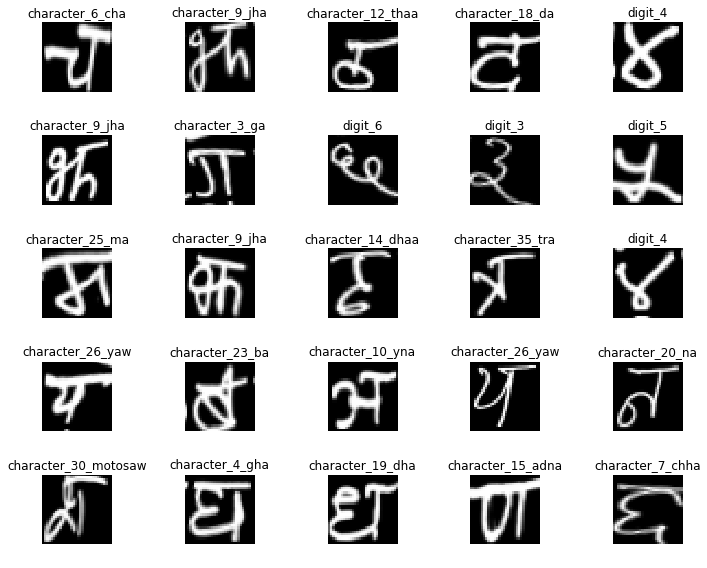

In [30]:
data.show_batch(rows=5,  figsize=(10,8))

In [31]:
print(data.classes)
data.c

['character_10_yna', 'character_11_taamatar', 'character_12_thaa', 'character_13_daa', 'character_14_dhaa', 'character_15_adna', 'character_16_tabala', 'character_17_tha', 'character_18_da', 'character_19_dha', 'character_1_ka', 'character_20_na', 'character_21_pa', 'character_22_pha', 'character_23_ba', 'character_24_bha', 'character_25_ma', 'character_26_yaw', 'character_27_ra', 'character_28_la', 'character_29_waw', 'character_2_kha', 'character_30_motosaw', 'character_31_petchiryakha', 'character_32_patalosaw', 'character_33_ha', 'character_34_chhya', 'character_35_tra', 'character_36_gya', 'character_3_ga', 'character_4_gha', 'character_5_kna', 'character_6_cha', 'character_7_chha', 'character_8_ja', 'character_9_jha', 'digit_0', 'digit_1', 'digit_2', 'digit_3', 'digit_4', 'digit_5', 'digit_6', 'digit_7', 'digit_8', 'digit_9']


46

# ResNet18 Training

In [34]:
learn = vision.cnn_learner(data, vision.models.resnet18, metrics=metrics.error_rate)

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/checkpoints/resnet18-5c106cde.pth
100%|██████████| 46827520/46827520 [00:00<00:00, 81507934.40it/s]


In [35]:
learn.fit_one_cycle(6)

epoch,train_loss,valid_loss,error_rate,time
0,2.360078,1.883777,0.522826,01:59
1,1.393236,0.947231,0.283120,02:01
2,0.952706,0.602090,0.185230,02:04
3,0.774502,0.431316,0.132928,02:04
4,0.639142,0.380299,0.115345,02:03
5,0.647196,0.363826,0.111253,02:04


In [0]:
learn.save('/content/devnagri-baseline')

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


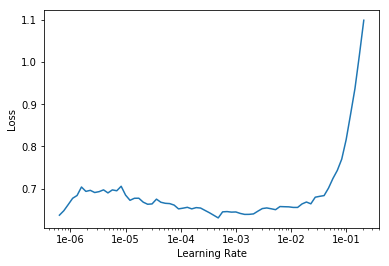

In [37]:
learn.lr_find()
learn.recorder.plot()

In [38]:
learn.unfreeze()
learn.fit_one_cycle(4, max_lr=slice(1e-3,1e-2))

epoch,train_loss,valid_loss,error_rate,time
0,0.449741,0.417749,0.110358,02:08
1,0.229417,0.128248,0.034847,02:08
2,0.094743,0.046091,0.012212,02:09
3,0.048519,0.027523,0.008376,02:09


In [0]:
learn.save('/content/devnagri-update1')

# Classification Interpretation

In [40]:
interp = vision.ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

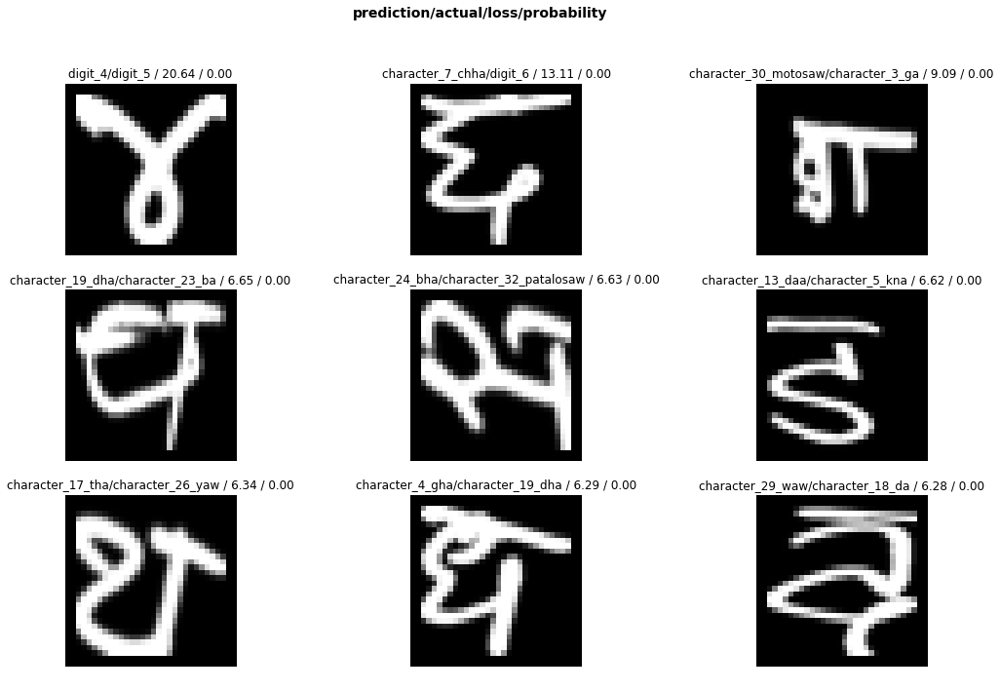

In [45]:
interp.plot_top_losses(9, figsize=(18,11))

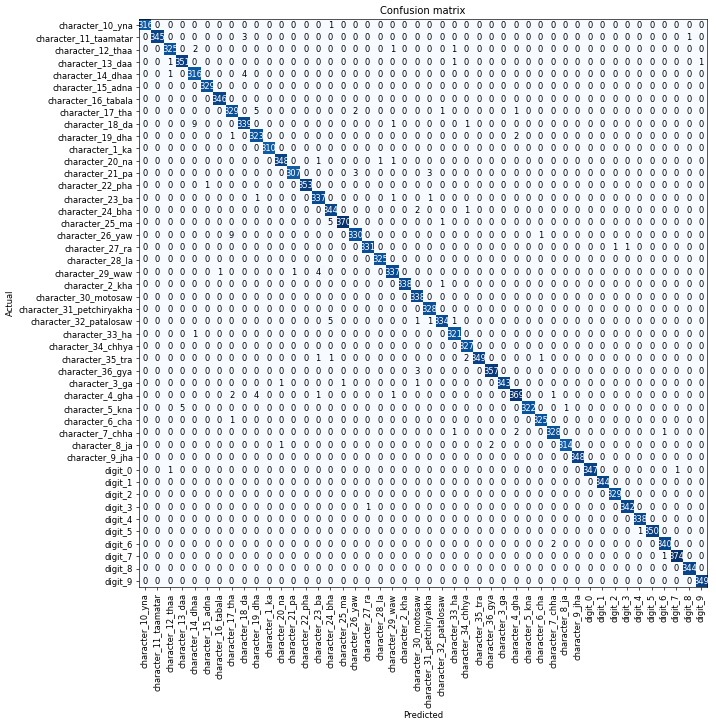

In [47]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [49]:
interp.most_confused(min_val=2)

[('character_18_da', 'character_14_dhaa', 9),
 ('character_26_yaw', 'character_17_tha', 9),
 ('character_17_tha', 'character_19_dha', 5),
 ('character_25_ma', 'character_24_bha', 5),
 ('character_32_patalosaw', 'character_24_bha', 5),
 ('character_5_kna', 'character_13_daa', 5),
 ('character_14_dhaa', 'character_18_da', 4),
 ('character_29_waw', 'character_23_ba', 4),
 ('character_4_gha', 'character_19_dha', 4),
 ('character_11_taamatar', 'character_18_da', 3),
 ('character_21_pa', 'character_26_yaw', 3),
 ('character_21_pa', 'character_31_petchiryakha', 3),
 ('character_36_gya', 'character_30_motosaw', 3),
 ('character_12_thaa', 'character_14_dhaa', 2),
 ('character_17_tha', 'character_26_yaw', 2),
 ('character_19_dha', 'character_4_gha', 2),
 ('character_24_bha', 'character_30_motosaw', 2),
 ('character_35_tra', 'character_34_chhya', 2),
 ('character_4_gha', 'character_17_tha', 2),
 ('character_7_chha', 'character_4_gha', 2),
 ('character_8_ja', 'character_36_gya', 2),
 ('digit_6', '